# [Bacterial Colony Growth](@id Bacteries)

In this example, we are going to create a bacterial model and grow a colony using it.

 - The implementation of the force interaction dynamics is the one presented by [Volfson et al. (2008)](https://www.pnas.org/doi/abs/10.1073/pnas.0706805105)
 - We use GPU accelerated dynamics

As described in other models, it is advised that the models are constructed by parts to avoid having to find bugs in a very complex system. Hence, we will split the model in two parts:

 - Forces model
 - Growth model

## Load the packages

In [1]:
using Base.Threads
println("Usando ", nthreads(), " threads 😎")

Usando 4 threads 😎


In [2]:
# import Pkg
# Pkg.activate("../")
# Pkg.instantiate()


In [3]:
# import Pkg; Pkg.add(["Revise", "GLMakie"])

In [4]:
# using Revise
# using CellBasedModels
# using CUDA
# using Distributions
# using GLMakie
# # using GeometryBasics
# import GLMakie: Point3f, Cylinder, Sphere, NoShading #Can be changes to Cairo or CLMakie

In [5]:
import Pkg

# Activa el entorno del proyecto
# Pkg.activate("C:/Users/julia/OneDrive/Escritorio/phd/Bacteria_ABM/ABM_CBM/")
Pkg.activate("/home/julia/Escritorio/Projects/Pushing/ABM_CBM/")



# Resuelve y asegura dependencias
Pkg.resolve()
Pkg.instantiate()


# Carga los paquetes de forma ordenada
using Revise
using CellBasedModels
ENV["JULIA_CUDA_USE_BINARYBUILDER"] = false  # (opcional, fuerza compilación local)
using CUDA
CUDA.set_runtime_version!(v"12.2")
using Distributions
using CairoMakie
using JSON

# Importa funciones específicas después
import CairoMakie: Point3f, Cylinder, Sphere, NoShading

CairoMakie.activate!()


  Activating project at `~/Escritorio/Projects/Pushing/ABM_CBM`
  No Changes to `~/Escritorio/Projects/Pushing/ABM_CBM/Project.toml`
    Updating `~/Escritorio/Projects/Pushing/ABM_CBM/Manifest.toml`
  [05823500] ↑ OpenLibm_jll v0.8.1+4 ⇒ v0.8.5+0
Precompiling packages...
   7627.6 ms  ✓ GeometryBasics
   1403.6 ms  ✓ Packing
   1786.4 ms  ✓ ShaderAbstractions
   2135.6 ms  ✓ MeshIO
   2399.4 ms  ✓ FreeTypeAbstraction
   3637.2 ms  ✓ MakieCore
   5339.0 ms  ✓ GridLayoutBase
   4531.1 ms  ✓ MathTeXEngine
  70205.6 ms  ✓ Makie
  23087.4 ms  ✓ CairoMakie
  37919.5 ms  ✓ GLMakie
  11 dependencies successfully precompiled in 126 seconds. 429 already precompiled.
┌ Info: Configure the active project to use CUDA 12.2; please re-start Julia for this to take effect.
└ @ CUDA /home/julia/.julia/packages/CUDA/jdJ7Z/lib/cudadrv/version.jl:82


## Forces model

We already use the defined forces model that is implemented in CBqodels. This is an exact copy of the rod model that you can find already predefined in `Models/rods.jl`. You can check the `Models` section of the documentation for more details.


In [6]:
rod2D = ABM(2,
    agent = Dict(
            :theta=>Float64,
            :d=>Float64,
            :l=>Float64,
            :fx=>Float64,
            :fy=>Float64,
            :W=>Float64,
        ),    #Local Interaction Parameters

    model = Dict(
            :E=>Float64,
            :eta=>Float64,

        ),        #Global parameters

    agentODE = quote

        fx = 0
        fy = 0
        W = 0
        @loopOverNeighbors i2 begin

            #Use the model provided in the documentation
            Fijx, Fijy, Wij = CBMModels.repulsiveForces_rods(x,y,d,l,theta,
                                    x[i2],y[i2],d[i2],l[i2],theta[i2],eta, E)

            #Append the repulsive forces
            fx += Fijx
            fy += Fijy
            W += Wij
            
        end

        #Equations
        dt(x) =  fx 
        dt(y) =  fy 
        dt(theta) =  W
    end,

    neighborsAlg=CBMNeighbors.CellLinked(cellEdge=4),
    platform=GPU(),
    agentAlg = CBMIntegrators.Heun()
);


### Initialize a coqunity with two bacteries and check forces

In [7]:
com = Community(rod2D,
            N=30,
            dt=0.0001,
            simBox = [-10 10;-10 10.],
            );


#Natural units scales
m = 1.E3 #g
t = 1/(60*60) # h
d = 1.E6 #um


com.E=1* 1.E6 *m/(t^2*d) #Pa
com.eta = 200 *m/(t^2*d) #Pa h

com.E=5* 1.E5 *m/(t^2*d) #Pa
com.eta = 200 *m/(t^2*d) #Pa h
 

com.d = 1.        
com.l = 3.99      



com.x = 0
com.y = 0
com.theta = 0;


In [8]:
com.N

30

In [9]:
for i in 1:com.N
    com.theta[i] = rand() * 2π
    com.x[i] = rand()*10-5
    com.y[i] = rand()*10-5
    com.l[i] = 3.0
    com.d[i] = 1.0

end

In [10]:
evolve!(com,steps=10000,saveEach=100,preallocateAgents=com.N)

In [11]:
function plotAgents2D!(ax, x, y, d, l, angle, p; colormap=:inferno, kargs...)
    for (xi, yi, li, di, ai, pi) in zip(x, y, l, d, angle, p)



            colorval = pi
            # colormap = :inferno
            meshscatter!(ax,
                [xi + li/2 * cos(ai)],
                [yi + li/2 * sin(ai)];
                marker = Sphere(Point3f(0, 0, 0), Float32(1)),
                markersize = [Point3f(di/2, di/2, di/2)],
                color = [colorval],
                colormap = colormap,
                kargs...
            )
            meshscatter!(ax,
                [xi - li/2 * cos(ai)],
                [yi - li/2 * sin(ai)];
                marker = Sphere(Point3f(0, 0, 0), Float32(1)),
                markersize = [Point3f(di/2, di/2, di/2)],
                color = [colorval],
                colormap = colormap,
                kargs...
            )
            meshscatter!(ax,
                [xi],
                [yi];
                marker = Cylinder(Point3f(-.5, 0, 0), Point3f(.5, 0, 0), Float32(1)),
                markersize = [Point3f(li, di/2, di/2)],
                rotation = [ai],
                color = [colorval],
                colormap = colormap,
                kargs...
            )

    end
    return
end


plotAgents2D! (generic function with 1 method)

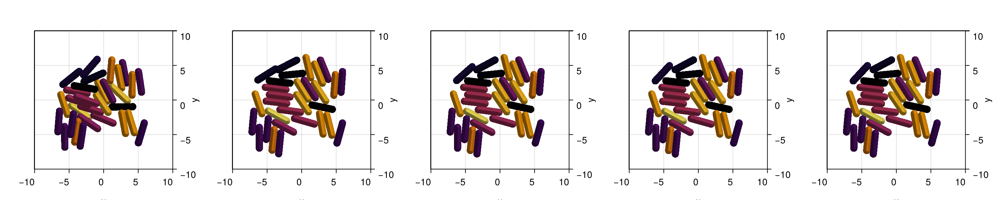

CairoMakie.Screen{IMAGE}


In [12]:
fig = Figure(size=(1500,300))

for (i,j) in enumerate([1:round(Int,length(com)/4):length(com);length(com)])
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    plotAgents2D!(
    ax,
    com[j][:x],
    com[j][:y],
    com[j][:d],
    com[j][:l],
    com[j][:theta],
    com[j][:theta],
    colorrange = (0, 2*pi)
)

    xlims!(-10,10)
    ylims!(-10,10)
end

display(fig)

In [13]:

function log_community_state(parameters::OrderedDict, t::Int, path::String = "Tods_c.txt")
    # Convert keys to strings so JSON can serialize them
    string_keys = Dict(string(k) => v for (k, v) in parameters)
    # Build entry
    entry = Dict("t" => t, "parameters" => string_keys)
    # Save as a JSON line
    open(path, "a") do io
        println(io, JSON.json(entry))
    end
end


function load_parameters_log(path::String = "Tods_c.txt")
    log = Dict{Int, OrderedDict{Symbol, Any}}()
    for line in eachline(path)
        entry = JSON.parse(line)
        t = entry["t"]
        raw_params = entry["parameters"]
        params = OrderedDict(Symbol(k) => v for (k, v) in raw_params)
        log[t] = params
    end
    times = sort(collect(keys(log)))
    com_array = [log[t] for t in times]
    return com_array, times
end



load_parameters_log (generic function with 2 methods)

## Growth model

We construct over the forces model to add bacterial growth and cell division rules.

In [14]:
function plotMixedAgents2D!(ax, x, y, d, l, angle, type, p; kargs...)
    for (xi, yi, li, di, ai, ti, pi) in zip(x, y, l, d, angle, type, p)


        if ti== 0  # rods
            # colorval = pi
            # colormap = :Blues
            meshscatter!(ax,
                [xi + li/2 * cos(ai)],
                [yi + li/2 * sin(ai)];
                marker = Sphere(Point3f(0, 0, 0), Float32(1)),
                markersize = [Point3f(di/2, di/2, di/2)],
                color = [RGBf(140 /255, 198 /255, 63/255)],
                # colormap = colormap,
                kargs...
            )
            meshscatter!(ax,
                [xi - li/2 * cos(ai)],
                [yi - li/2 * sin(ai)];
                marker = Sphere(Point3f(0, 0, 0), Float32(1)),
                markersize = [Point3f(di/2, di/2, di/2)],
                color = [RGBf(140 /255, 198 /255, 63/255)],

                # colormap = colormap,
                kargs...
            )
            meshscatter!(ax,
                [xi],
                [yi];
                marker = Cylinder(Point3f(-.5, 0, 0), Point3f(.5, 0, 0), Float32(1)),
                markersize = [Point3f(li, di/2, di/2)],
                rotation = [ai],
                color = [RGBf(140 /255, 198 /255, 63/255)],

                kargs...
            )
        else  # puntos
            colorval = pi
            colormap = :Reds
            meshscatter!(ax,
                [xi + li/2 * cos(ai)],
                [yi + li/2 * sin(ai)];
                marker = Sphere(Point3f(0, 0, 0), Float32(1)),
                markersize = [Point3f(di/2, di/2, di/2)],
                color =  [RGBf(255 /255, 179 /255, 73/255)],
                kargs...
            )
            meshscatter!(ax,
                [xi - li/2 * cos(ai)],
                [yi - li/2 * sin(ai)];
                marker = Sphere(Point3f(0, 0, 0), Float32(1)),
                markersize = [Point3f(di/2, di/2, di/2)],
                color =  [RGBf(255 /255, 179 /255, 73/255)],
                colormap = colormap,
                kargs...
            )
            meshscatter!(ax,
                [xi],
                [yi];
                marker = Cylinder(Point3f(-.5, 0, 0), Point3f(.5, 0, 0), Float32(1)),
                markersize = [Point3f(li, di/2, di/2)],
                rotation = [ai],
                color =  [RGBf(255 /255, 179 /255, 73/255)],
                colormap = colormap,
                kargs...
            )
        end

    end
    return
end


plotMixedAgents2D! (generic function with 1 method)

In [183]:
rods_PGA = ABM(2,

    agent = Dict(
                :theta=>Float64,
                :d=>Float64,
                :l=>Float64,
                :fx=>Float64,
                :fy=>Float64,
                :W=>Float64,
                :lTarget => Float64,
                :growth=>Float64,
                :Kc => Float64, #Half saturation constant for the medium
                :generation => Int,
                :Vm => Float64,
            ),

    model = Dict(
                :E=>Float64,
                :eta=>Float64,
                :A=>Float64,
                :σlTarget=>Float64,
                :lMax=>Float64,
                :D_c => Float64,
                :beta_c => Float64, #Uptake rate of the cells in the medium
                :D_PGA => Float64, #Decay rate of the cells in the medium
                :alpha_PGA=>Float64, #Decay rate of the cells in the medium
                :beta_PGA=>Float64, #Decay rate of the cells in the medium
                :delta_PGA=>Float64, #Decay rate of the medium
                :Kp => Float64, #Half saturation constant for the medium
                :Kpc => Float64, #Half saturation constant for the medium
                :npc => Int, #Hill coefficient for the medium
                :nu => Float64, 
                :alpha_QS =>Float64,
                :alpha_c2 =>Float64,
                :delta_QS =>Float64,
                :delta_c2 =>Float64,
                :D_QS =>Float64,
                :D_c2 =>Float64,
                :alpha_V =>Float64, 
                :delta_V =>Float64, 
                :beta_V =>Float64, 
                :nV =>Float64, 
                :KVc =>Float64,
                :Kpq => Float64, #Half saturation constant for the medium
                :npq => Int, #Hill coefficient for the medium
                :KpV => Float64, #Half saturation constant for the medium
                :npV => Int, #Hill coefficient for the medium
                :dens0 => Float64,
                :Kpc2 => Float64, #Half saturation constant for the medium
                :Kc2 => Float64, #Half saturation constant for the medium
                :npc2 => Int, #Hill coefficient for the medium
                :beta_c2 => Float64

            ),
    
    medium = Dict(
        :c => Float64,        #Add a medium parameter
        :PGA => Float64,        #Add a medium parameter
        :Hx => Float64,  #Add a medium parameter
        :Hy => Float64,        #Add a medium parameter
        :QS => Float64,
        :c2 => Float64,
    ),

 
    agentODE = quote  
        
        dt(l) = l*growth*c/(Kc+c) 

        fx = 0
        fy = 0
        W = 0
        @loopOverNeighbors i2 begin
            #Use the model provided in the documentation
            Fijx, Fijy, Wij = CBMModels.repulsiveForces_rods(x,y,d,l,theta,
                                    x[i2],y[i2],d[i2],l[i2],theta[i2],eta, E)

            #Append the repulsive forces
            fx += Fijx
            fy += Fijy
            W += Wij            
        end



        Fijx= -nu * Hx 
        Fijy= -nu * Hy 
        # Wij = ((xiAux-x)*Fijy - (yiAux-y)*Fijx) * 12. / (eta/A*(l + d)^2)

        fx += Fijx* 12. / (eta*(l + d)^2)
        fy += Fijy* 12. / (eta*(l + d)^2)
        # W += Wij

        #Equations
        dt(x) =  fx 
        dt(y) =  fy 
        dt(theta) =  W
        # dt(Vm) =  alpha_V - Vm*delta_V
        dt(Vm) =  alpha_V - Vm*delta_V - beta_V*1/(1 + (c/KVc)^nV)
    end,

    agentRule = quote #Bound cells

        #Add division
        if l > lTarget
            ww = CBMDistributions.uniform(-1,1)*1.E-3 #To add some random torque at division time

            # ww = 0 #To add some random torque at division time
            #Add a new cell
            @addAgent(
                    x=(l+d)/4*cos(theta)+x,
                    y=(l+d)/4*sin(theta)+y,
                    l=(l-d)/2,
                    W=ww,
                    lTarget = lMax,
                    # lTarget = CBMDistributions.uniform(lMax-σlTarget,lMax+σlTarget),
                    )
            #Add a second cell
            @addAgent(
                    x=-(l+d)/4*cos(theta)+x,
                    y=-(l+d)/4*sin(theta)+y,
                    l=(l-d)/2,
                    lTarget = lMax, #New target length at which the bactery should divide
                    W=ww)
            #Remove the old cell
            @removeAgent()
        end
        
        c += (-l*beta_c*c/(Kc+c))*dt
        # PGA += (alpha_PGA*c^npc/(Kpc^npc+c^npc)*QS^npq/(Kpq^npq+QS^npq)*1/(1+(Vm/KpV)^npV)+ beta_PGA*PGA/(PGA+Kp))*dt
        # PGA += (alpha_PGA*c^npc/(Kpc^npc+c^npc)*(QS/Kpq)^npq/(1+(QS/Kpq)^npq+(c2/Kc)^nc)*1/(1+(Vm/KpV)^npV)+ beta_PGA*PGA/(PGA+Kp))*dt
        PGA += (alpha_PGA*c2^npc/(Kpc2^npc+c2^npc)*(QS/Kpq)^npq/((1+(QS/Kpq)^npq))/(1+(Vm/KpV)^npV))*dt
        QS += (alpha_QS)*dt
        c2 += (-l*beta_c2*c2/(Kc2+c2))*dt
    end,

    #Medium dynamics with dirichlet conditions and a wall that is as oscillating source of material
    mediumODE=quote 

        if @mediumInside()
            dt(c) =D_c*(@∂2(1,c)+@∂2(2,c))
            dt(PGA) = D_PGA*(@∂2(1,PGA)+@∂2(2,PGA)) - delta_PGA*PGA 
            dt(QS) = D_QS*(@∂2(1,QS)+@∂2(2,QS)) - delta_QS*QS
            dt(c2) = D_c2*(@∂2(1,c2)+@∂2(2,c2)) 
            Hx = @∂(1,PGA) 
            Hy = @∂(2,PGA)
        elseif @mediumBorder(1,-1) 
            c = dens0*c[2,i2_]
            PGA = 0
            QS = dens0*QS[2,i2_]
            c2 = dens0*c2[2,i2_]
        elseif @mediumBorder(1,1)
            c = dens0*c[end-1,i2_]
            PGA = 0
            QS = dens0*QS[end-1,i2_]
            c2 = dens0*c2[end-1,i2_]
        elseif @mediumBorder(2,-1)
            c = dens0*c[i1_,2]
            PGA = 0
            QS = dens0*QS[i1_,2]
            c2 = dens0*c2[i1_,2]

        elseif @mediumBorder(2,1)
            c = dens0*c[i1_,end-1]
            PGA = 0
            QS = dens0*QS[i1_,end-1]
            c2 = dens0*c2[i1_,end-1]

        end
    end,

    neighborsAlg=CBMNeighbors.CellLinked(cellEdge=4),
    platform=GPU(),
    agentAlg=CBMIntegrators.Heun(),
    mediumAlg=DifferentialEquations.Euler(),
);

In [249]:
com = Community(rods_PGA,
            N=2,
            dt=0.0001,
            simBox = [-150 150;-150 150.],
            NMedium=[150,150],
            );


#Natural units scales
m = 1.E3 #g
t = 1/(60*60) # h
d = 1.E6 #um


com.E=5* 1.E5 *m/(t^2*d) #Pa
com.eta = 200 *m/(t^2*d) #Pa h

com.growth = 5.
com.lMax = 4.     
com.σlTarget = 0 

com.d = 1.        
com.l = 3.99      
com.lTarget = 4.  
com.x[1]=-30
com.x[2]=30
com.y=0
com.theta=0

com.dens0=1

# com.PGA=0
# com.alpha_PGA = 10000
# com.delta_PGA = 100
# com.D_PGA = 50
# com.npc = 1
# com.v = 2.5*10^7
# com.Kpc=0.00001
# com.Kpq=10
# com.npq=10

com.PGA=0
# com.alpha_PGA = 1
com.alpha_PGA = 1000
com.delta_PGA = 0
com.beta_PGA = 0
com.Kp = 0.2
com.D_PGA = 2.5
com.npc = 10
com.nu = 2.5*10^9
com.Kpc= 5*1E-3
com.Kpc2= 1
com.npc2=4
com.Kpq=2
com.npq=10



# com.Kpq=2.5
# com.npq=10
# com.Kpq2 = 0.2
# com.npq2 = 10

com.D_c = 1000
com.D_c2 = 1000
# com.cm = 1 #Medium concentration
com.c = 1 
com.c2 = 1 
com.Kc = 1 #Half saturation constant for the medium
com.Kc2 = 1 #Half saturation constant for the medium
com.beta_c = 12.5 #Growth rate of the cells in the medium
com.beta_c2 = 2 #Growth rate of the cells in the medium


# com.Vm = -149
# com.alpha_V = -150
# com.delta_V = 1
# com.beta_V = 100
# com.KVc = 5E-4
# com.nV = 10


com.Vm = -1
com.alpha_V = -1.
com.delta_V = 1
com.beta_V = 2.

com.KVc = 5*1E-3
com.nV = 10




com.KpV = 2
com.npV = 10

com.QS=0
com.alpha_QS = 1.
com.delta_QS = 0.05
com.D_QS = 500 



com.A=0.4




0.4

In [250]:
open("Tods_c.txt", "w") do f
    # clear file at start
end

In [251]:
com.N < 3000

true

In [252]:
com.N

2

In [254]:
prev_steps=Int(round(0/com.dt))
steps=Int(round(15/com.dt))
# steps=Int(round(35/com.dt))
saveEach = Int(round(1/com.dt))/10
N=3000

loadToPlatform!(com,preallocateAgents=N)

evolve!(com,steps=steps,saveEach=saveEach,progressMessage=(com)->println("Step: ",Int(round(com.t/com.dt))))
bringFromPlatform!(com)

Step: 1000
Step: 2000
Step: 3000
Step: 4000
Step: 5000
Step: 6000
Step: 7000
Step: 8000
Step: 9000
Step: 10000
Step: 11000
Step: 12000
Step: 13000
Step: 14000
Step: 15000
Step: 16000
Step: 17000
Step: 18000
Step: 19000
Step: 20000
Step: 21000
Step: 22000
Step: 23000
Step: 24000
Step: 25000
Step: 26000
Step: 27000
Step: 28000
Step: 29000
Step: 30000
Step: 31000
Step: 32000
Step: 33000
Step: 34000
Step: 35000
Step: 36000
Step: 37000
Step: 38000
Step: 39000
Step: 40000
Step: 41000
Step: 42000
Step: 43000
Step: 44000
Step: 45000
Step: 46000
Step: 47000
Step: 48000
Step: 49000
Step: 50000
Step: 51000
Step: 52000
Step: 53000
Step: 54000
Step: 55000
Step: 56000
Step: 57000
Step: 58000
Step: 59000
Step: 60000
Step: 61000
Step: 62000
Step: 63000
Step: 64000
Step: 65000
Step: 66000
Step: 67000
Step: 68000
Step: 69000
Step: 70000
Step: 71000
Step: 72000
Step: 73000
Step: 74000
Step: 75000
Step: 76000
Step: 77000
Step: 78000
Step: 79000
Step: 80000
Step: 81000
Step: 82000
Step: 83000
Step: 84000
S

In [255]:
length(com)

150

In [256]:
com[50]

Community with 590 agents.


In [257]:
saveJLD2("Kissing.jld2", com, overwrite=true)

1:151

In [258]:
# com=loadJLD2("base.jld2")

In [259]:
length(com_saved)

150

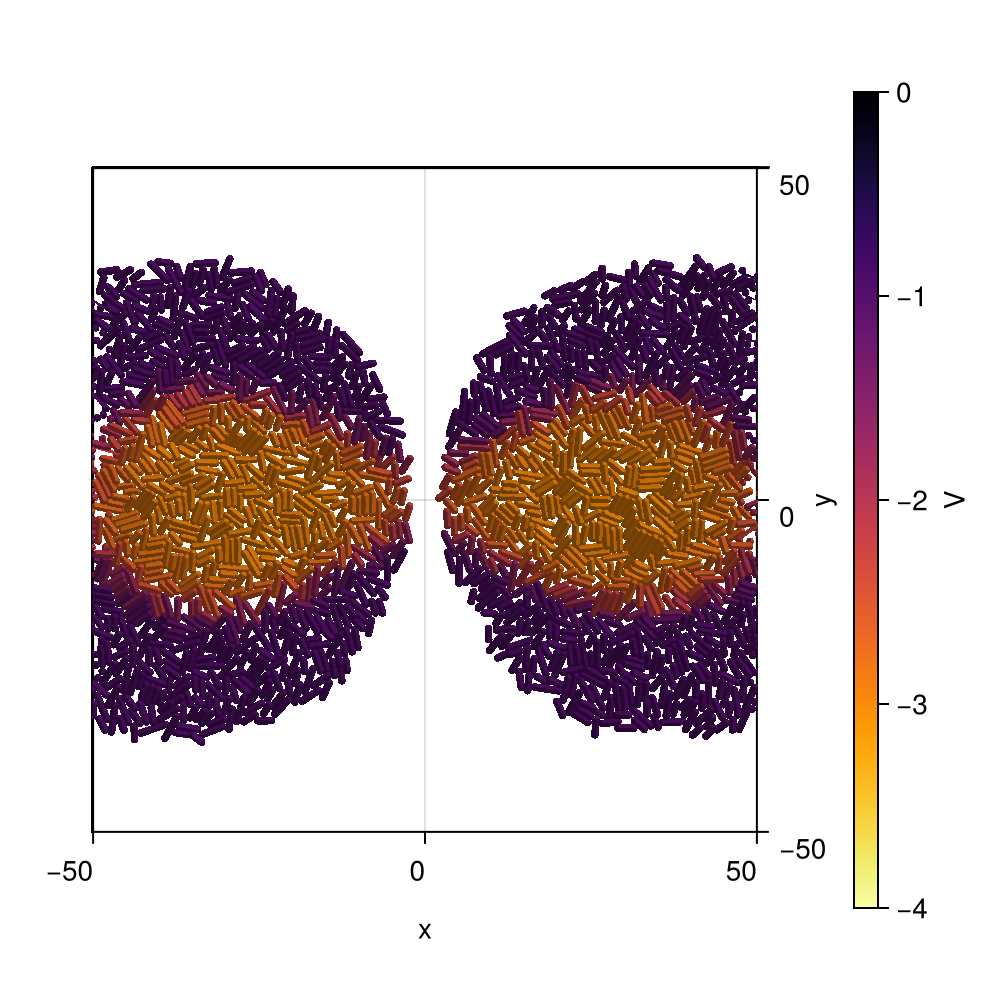

CairoMakie.Screen{IMAGE}


In [260]:

cmap_transp_orange = cgrad(
    [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
     RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)
    506
)

colormap_c=cmap_transp_orange
# colormap_c=:Oranges
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:c]), com)))
colorrange_c = (0.0,  maximum(com.Vm))

fig = Figure(size=(500,500))

js =  length(com)

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    plotAgents2D!(
    ax,
    com[j][:x],
    com[j][:y],
    com[j][:d],
    com[j][:l],
    com[j][:theta],
    com[j][:Vm],
    colormap = Reverse(:inferno),
    colorrange =  (-4, 0),
    )

    xlims!(-50,50)
    ylims!(-50,50)
end

Colorbar(fig[1, length(js) + 1],
    colormap = Reverse(:inferno),
    colorrange = (-4, 0),
    label = "V"
)
display(fig)

In [261]:
minimum(com.Vm)

-2.991755247116089

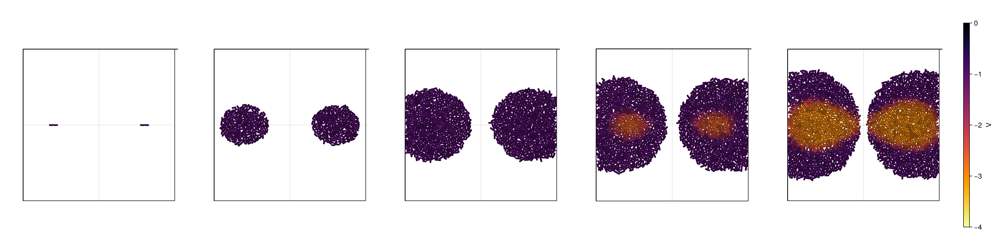

CairoMakie.Screen{IMAGE}


In [262]:

fig = Figure(size=(2000,500))

# js = [1:round(Int, length(com)/4):length(com); length(com)]
# js =  length(com)
js = round.(Int, range(1, length(com), length=5))
for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false,
                xticksvisible=false,
                yticksvisible=false,
                xticklabelsvisible=false,
                yticklabelsvisible=false,
                xlabelvisible=false,
                ylabelvisible=false

            )

    plotAgents2D!(
    ax,
    com[j][:x],
    com[j][:y],
    com[j][:d],
    com[j][:l],
    com[j][:theta],
    com[j][:Vm],
    colormap = Reverse(:inferno),
    colorrange =  (-4, 0),
    )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = Reverse(:inferno),
    colorrange =  (-4, 0),
    label = "V"
)
display(fig)

In [263]:
com.dt

0.0001

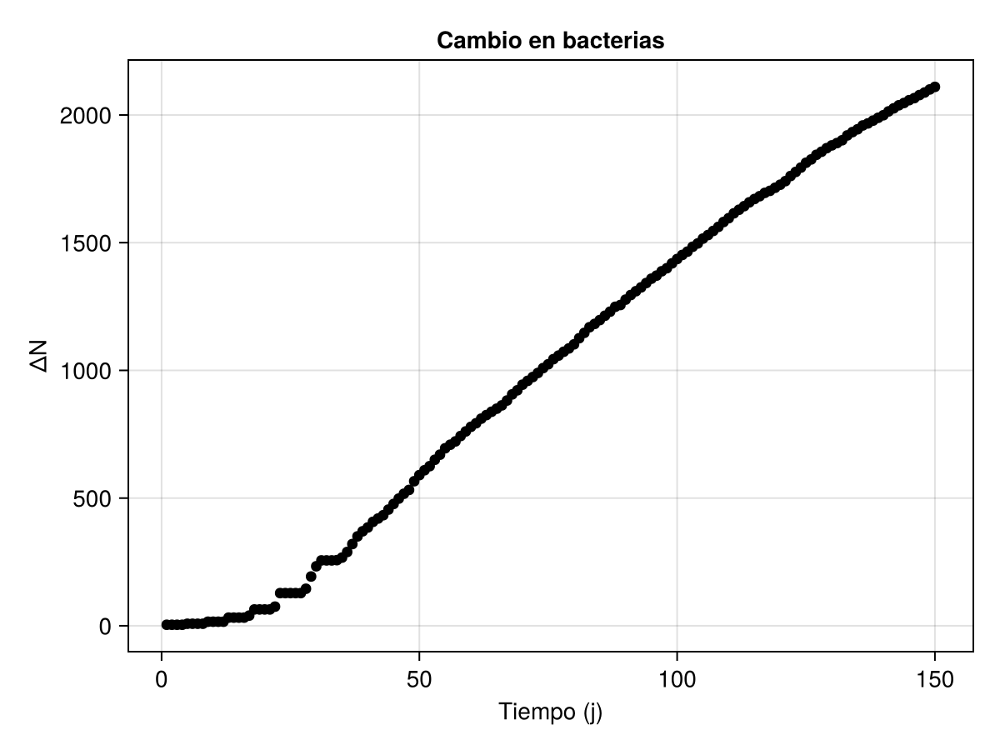

In [264]:
# Extraemos N
N = [length(com[j][:x]) for j in 1:length(com)]
P = [maximum(maximum(com[j][:PGA])) for j in 1:length(com)]
Q = [maximum(maximum(com[j][:QS])) for j in 1:length(com)]
C2 = [maximum(maximum(com[j][:c2])) for j in 1:length(com)]
V = [minimum(minimum(com[j][:Vm])) for j in 1:length(com)]
C = [minimum(minimum(com[j][:c])) for j in 1:length(com)]

# Diferencia entre tiempos consecutivos
dN = diff(N)

# Eje temporal (para diff hay un punto menos)
t = 1:length(N)

# Figura y ejes
fig = Figure()
ax = Axis(fig[1, 1], xlabel = "Tiempo (j)", ylabel = "ΔN", title = "Cambio en bacterias")

# Scatter plot
scatter!(ax, t, N, color = :black)


fig

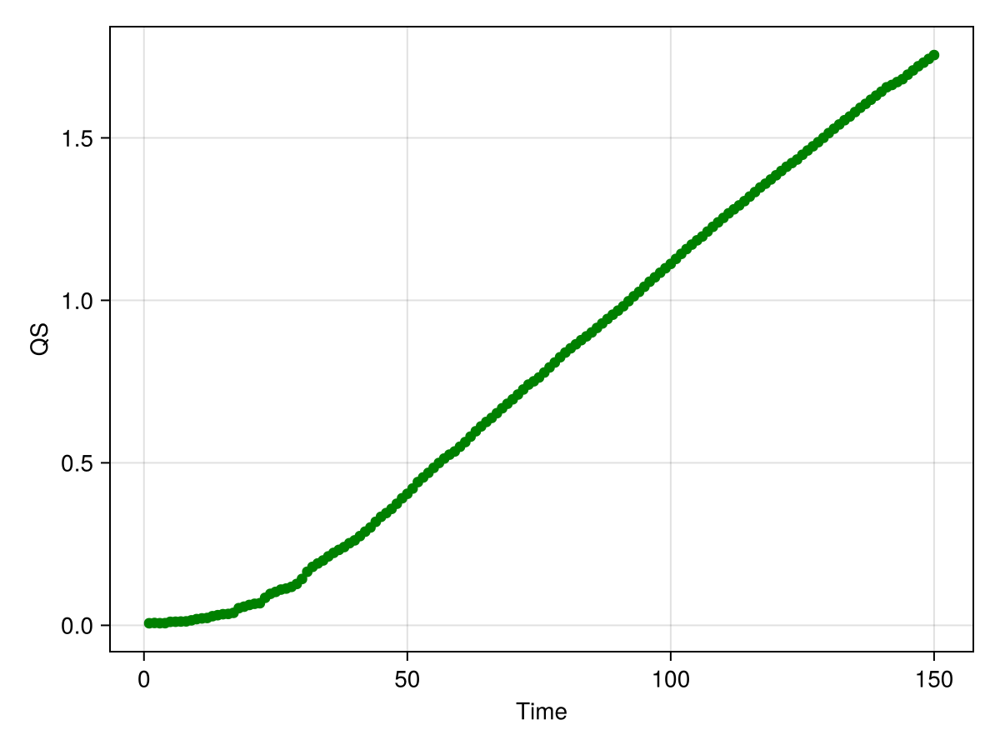

In [265]:
# Figura y ejes
fig = Figure()
ax = Axis(fig[1, 1], xlabel = "Time", ylabel = "QS")

# Scatter plot
scatter!(ax, t, Q, color = :green)
fig

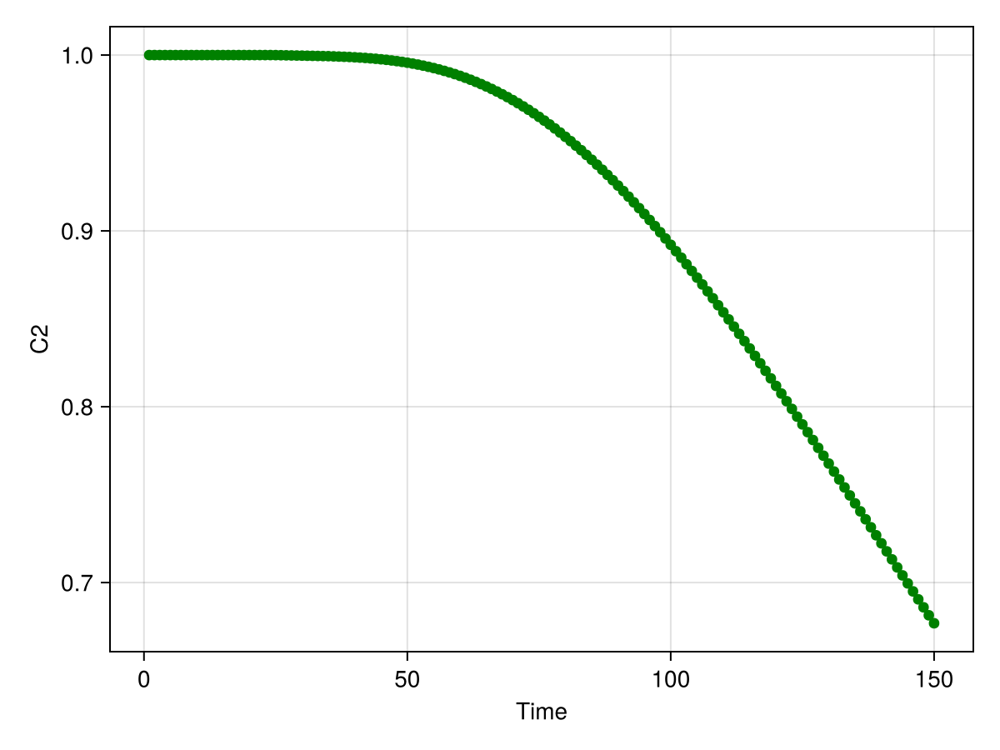

In [266]:
# Figura y ejes
fig = Figure()
ax = Axis(fig[1, 1], xlabel = "Time", ylabel = "C2")

# Scatter plot
scatter!(ax, t, C2, color = :green)
fig

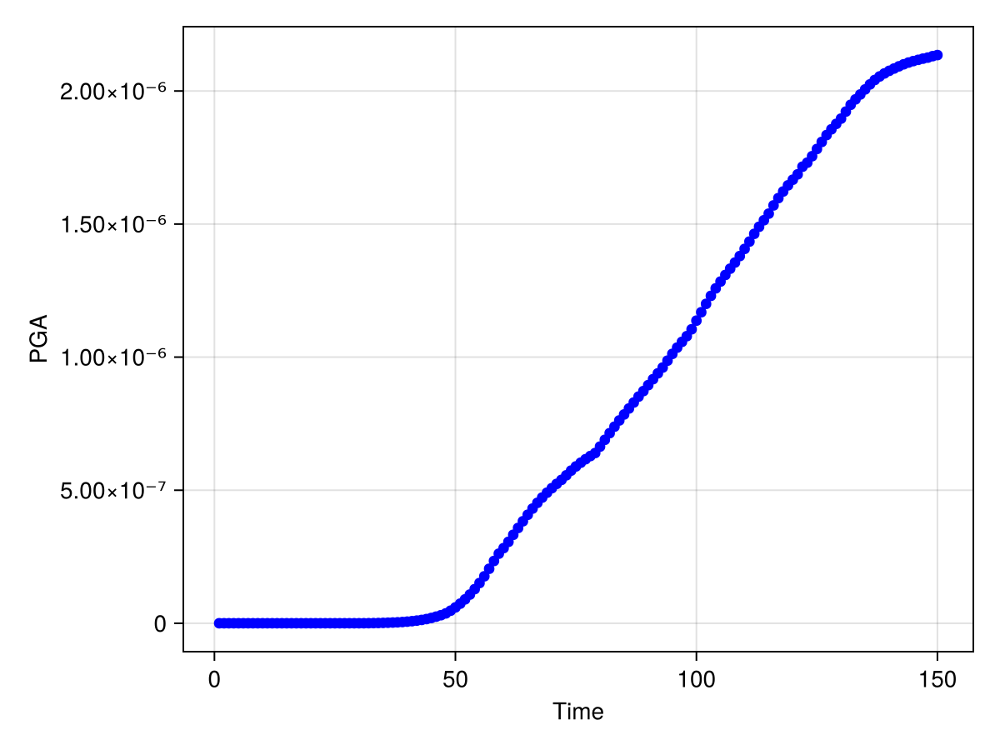

In [267]:
# Figura y ejes
fig = Figure()
ax = Axis(fig[1, 1], xlabel = "Time", ylabel = "PGA")

# Scatter plot
scatter!(ax, t, P, color = :blue)
fig

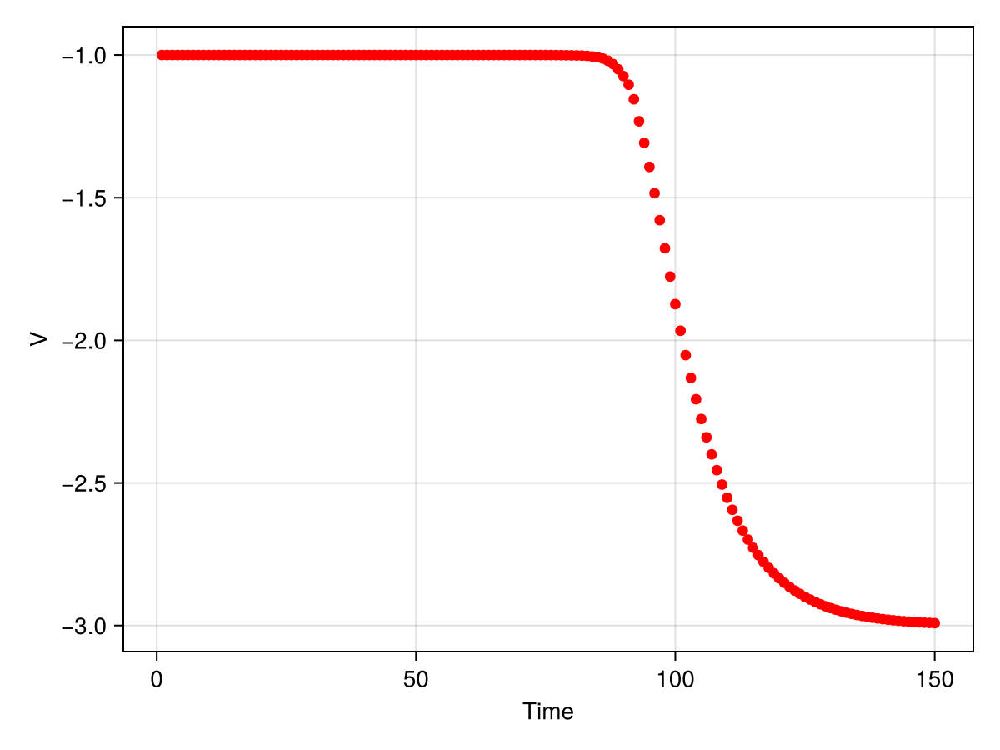

In [268]:
# Figura y ejes
fig = Figure()
ax = Axis(fig[1, 1], xlabel = "Time", ylabel = "V")

# Scatter plot
scatter!(ax, t, V, color = :red)
fig

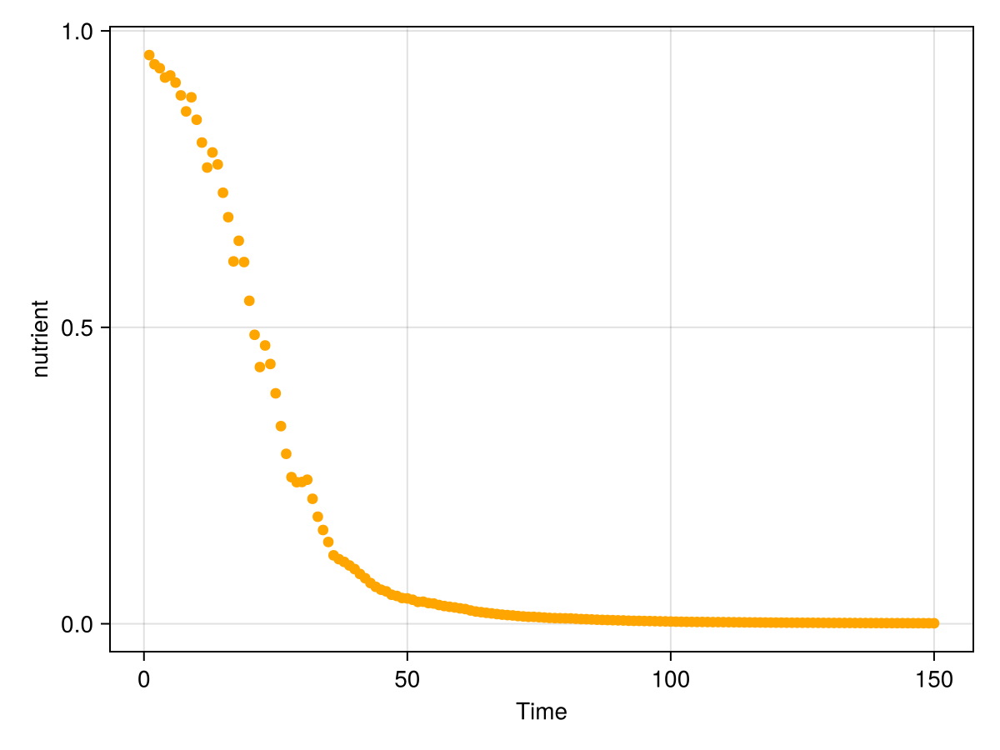

In [269]:
# Figura y ejes
fig = Figure()
ax = Axis(fig[1, 1], xlabel = "Time", ylabel = "nutrient")

# Scatter plot
scatter!(ax, t, C, color = :orange)
fig

In [208]:
minimum(com.c)

0.0007734237588010728

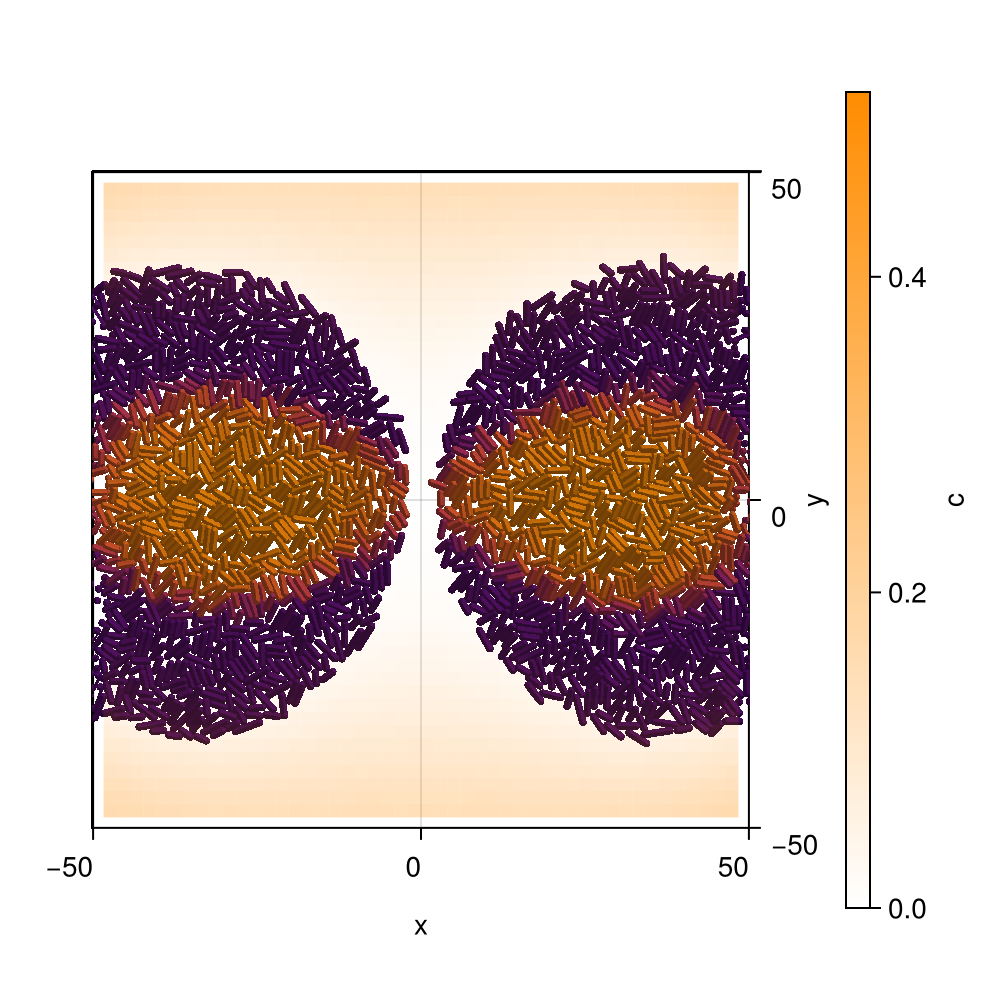

CairoMakie.Screen{IMAGE}


In [72]:

cmap_transp_orange = cgrad(
    [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
     RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)
)
simBox_cpu = Array(com.simBox)
colormap_c=cmap_transp_orange
# colormap_c=:Oranges
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:c]), com)))
colorrange_c = (0.0,  maximum(com.c))

fig = Figure(size=(500,500))

js =  length(com)

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    plotAgents2D!(
    ax,
    com[j][:x],
    com[j][:y],
    com[j][:d],
    com[j][:l],
    com[j][:theta],
    com[j][:Vm],
    colormap = Reverse(:inferno),
    colorrange =  (-4, 0),
    )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.c)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.c)[1]),
            com[j].c,
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "c"
)
display(fig)

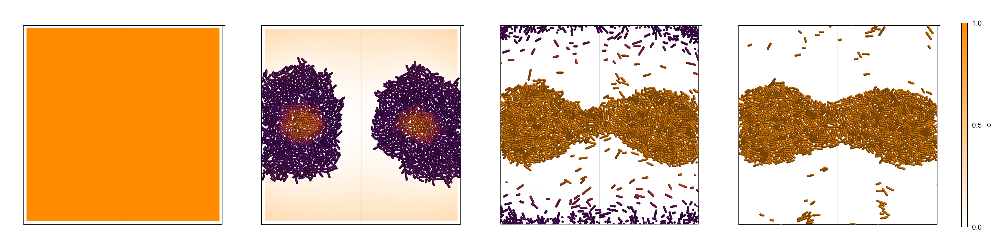

CairoMakie.Screen{IMAGE}


In [ ]:
com,times=load_parameters_log("Tods_c.txt")
fig = Figure(size=(2000,500))

cmap_transp_orange = cgrad(
    [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
     RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)
    506
)

colormap_c=cmap_transp_orange

# js = [1:round(Int, length(com)/4):length(com); length(com)]
# js =  length(com)
js = round.(Int, range(1, length(com), length=4))
for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false,
                xticksvisible=false,
                yticksvisible=false,
                xticklabelsvisible=false,
                yticklabelsvisible=false,
                xlabelvisible=false,
                ylabelvisible=false

            )

    plotAgents2D!(
    ax,
    com[j][:x],
    com[j][:y],
    com[j][:d],
    com[j][:l],
    com[j][:theta],
    com[j][:Vm],
    colormap = Reverse(:inferno),
    colorrange =  (-4, 0),
    )

    m2 = heatmap!(ax,
        range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.c)[1]),
        range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.c)[1]),
        Float64.(hcat(com[j][:c]...)),
        colormap = colormap_c,
        colorrange = colorrange_c
    )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "c"
)

display(fig)

In [32]:
com.c[50,50], com.c[50,40]

(0.0003978644259726807, 0.0010019181211399222)

In [33]:
maximum(com.QS)

3.015804405252508

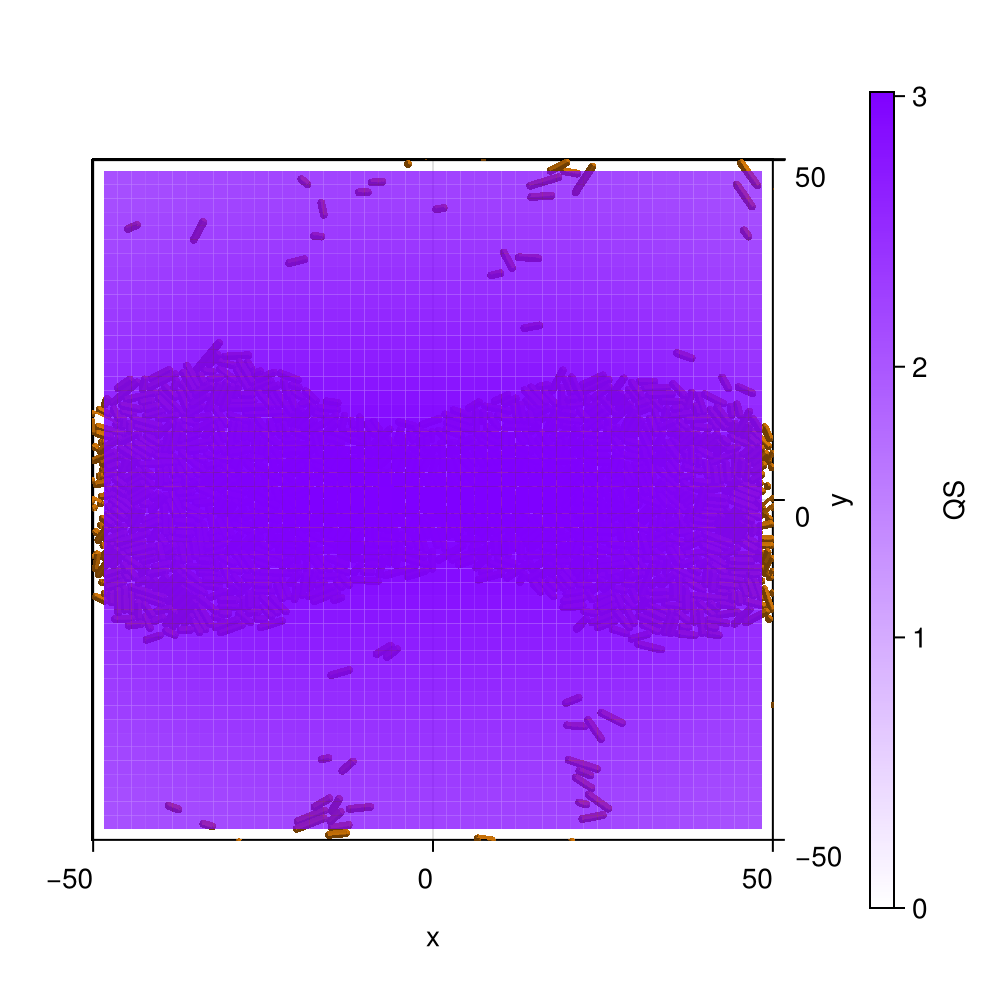

CairoMakie.Screen{IMAGE}


In [ ]:
com,times=load_parameters_log("Tods_c.txt")
simBox_cpu = Array(com.simBox)  # copia a CPU

cmap_transp_orange = cgrad(
    [RGBAf(0.5, 0, 1, 0.0),   # verde con alfa 0 (transparente)
     RGBAf(0.5, 0, 1, 1.0)],  # verde con alfa 1 (opaco)
    506
)

colormap_c=cmap_transp_orange
# colormap_c=:Oranges
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:QS]), com)))
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:QS]), com)))

fig = Figure(size=(500,500))

js =  length(com)

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    plotAgents2D!(
    ax,
    com[j][:x],
    com[j][:y],
    com[j][:d],
    com[j][:l],
    com[j][:theta],
    com[j][:Vm],
    colormap = Reverse(:inferno),
    colorrange =  (-4, 0),
    )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.QS)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.QS)[1]),
            Float64.(hcat(com[j][:QS]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "QS"
)
display(fig)

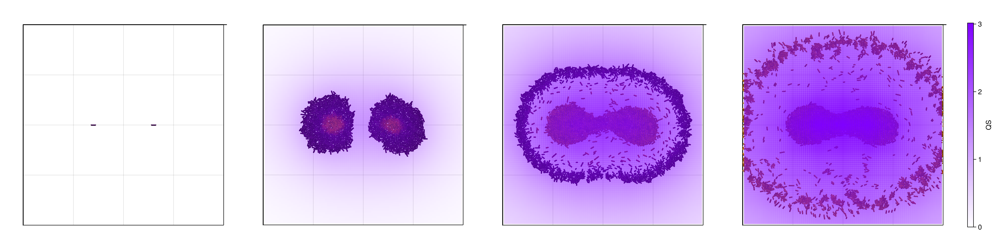

CairoMakie.Screen{IMAGE}


In [ ]:
com,times=load_parameters_log("Tods_c.txt")
fig = Figure(size=(2000,500))

cmap_transp_orange = cgrad(
    [RGBAf(0.5, 0, 1, 0.0),   # verde con alfa 0 (transparente)
     RGBAf(0.5, 0, 1, 1.0)],  # verde con alfa 1 (opaco)
    506
)
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:QS]), com)))

colormap_c=cmap_transp_orange

# js = [1:round(Int, length(com)/4):length(com); length(com)]
# js =  length(com)
js = round.(Int, range(1, length(com), length=4))
for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false,
                xticksvisible=false,
                yticksvisible=false,
                xticklabelsvisible=false,
                yticklabelsvisible=false,
                xlabelvisible=false,
                ylabelvisible=false

            )

    plotAgents2D!(
    ax,
    com[j][:x],
    com[j][:y],
    com[j][:d],
    com[j][:l],
    com[j][:theta],
    com[j][:Vm],
    colormap = Reverse(:inferno),
    colorrange =  (-4, 0),
    )

    m2 = heatmap!(ax,
        range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.QS)[1]),
        range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.QS)[1]),
        Float64.(hcat(com[j][:QS]...)),
        colormap = colormap_c,
        colorrange = colorrange_c
    )

    xlims!(-100,100)
    ylims!(-100,100)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "QS"
)

display(fig)

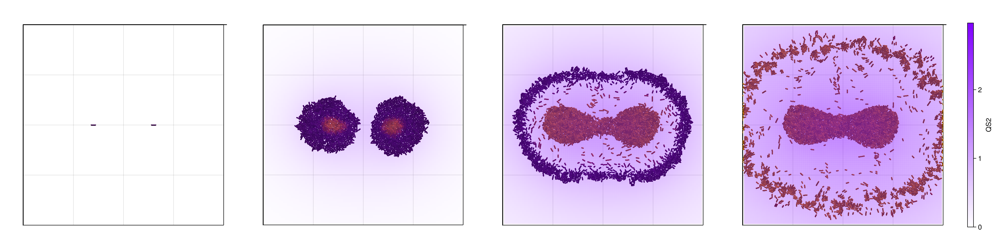

CairoMakie.Screen{IMAGE}


In [ ]:
com,times=load_parameters_log("Tods_c.txt")
fig = Figure(size=(2000,500))

cmap_transp_orange = cgrad(
    [RGBAf(0.5, 0, 1, 0.0),   # verde con alfa 0 (transparente)
     RGBAf(0.5, 0, 1, 1.0)],  # verde con alfa 1 (opaco)
    506
)
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:QS]), com)))

colormap_c=cmap_transp_orange

# js = [1:round(Int, length(com)/4):length(com); length(com)]
# js =  length(com)
js = round.(Int, range(1, length(com), length=4))
for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false,
                xticksvisible=false,
                yticksvisible=false,
                xticklabelsvisible=false,
                yticklabelsvisible=false,
                xlabelvisible=false,
                ylabelvisible=false

            )

    plotAgents2D!(
    ax,
    com[j][:x],
    com[j][:y],
    com[j][:d],
    com[j][:l],
    com[j][:theta],
    com[j][:Vm],
    colormap = Reverse(:inferno),
    colorrange =  (-4, 0),
    )

    m2 = heatmap!(ax,
        range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.QS2)[1]),
        range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.QS2)[1]),
        Float64.(hcat(com[j][:QS2]...)),
        colormap = colormap_c,
        colorrange = colorrange_c
    )

    xlims!(-100,100)
    ylims!(-100,100)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "QS2"
)

display(fig)

In [48]:
com.QS2[75, 75]

1.477413111064204

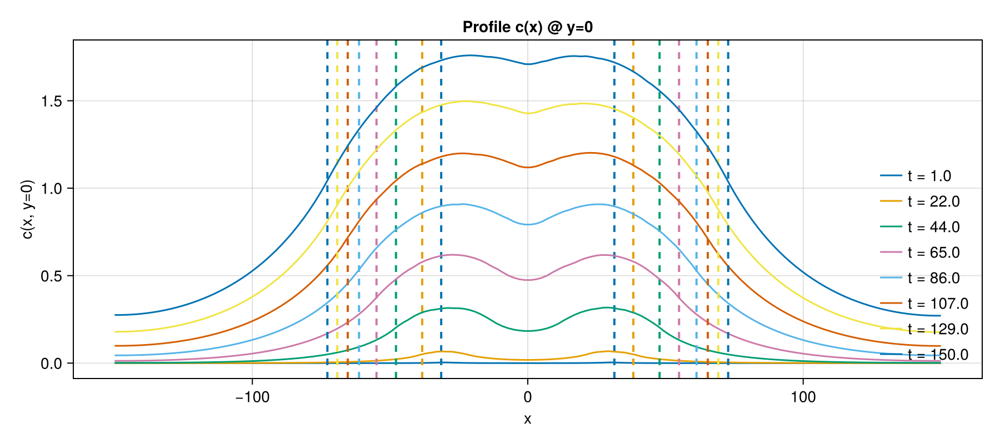

CairoMakie.Screen{IMAGE}


In [244]:
fig_line = Figure(size=(900, 400))
js = round.(Int, range(1, length(com), length=8))
axl = Axis(fig_line[1,1], xlabel="x", ylabel="c(x, y=0)", title="Profile c(x) @ y=0")

xgrid = collect(range(simBox_cpu[1,1], simBox_cpu[1,2], length=size(com.QS)[1]))

for (i,j) in enumerate(js)
    # matriz de concentración
    C = com[j].QS
    cx = @view C[:, 75]  # perfil en y = 50

    # traza el perfil y guarda el objeto para recuperar su color
    l = lines!(axl, xgrid, cx, label = "t = $(round(j, sigdigits=4))")

    # posición radial máxima
    rmax = sqrt(maximum(com[j].x.^2 .+ com[j].y.^2))

    # dibuja líneas verticales del mismo color
    vlines!(axl, [rmax, -rmax],
            color = l.color[],   # usa el color del perfil
            linestyle = :dash,
            linewidth = 2)
end
# ylims!(axl, 0, 1.05)
axislegend(axl; position=:rb, framevisible=false)
display(fig_line)


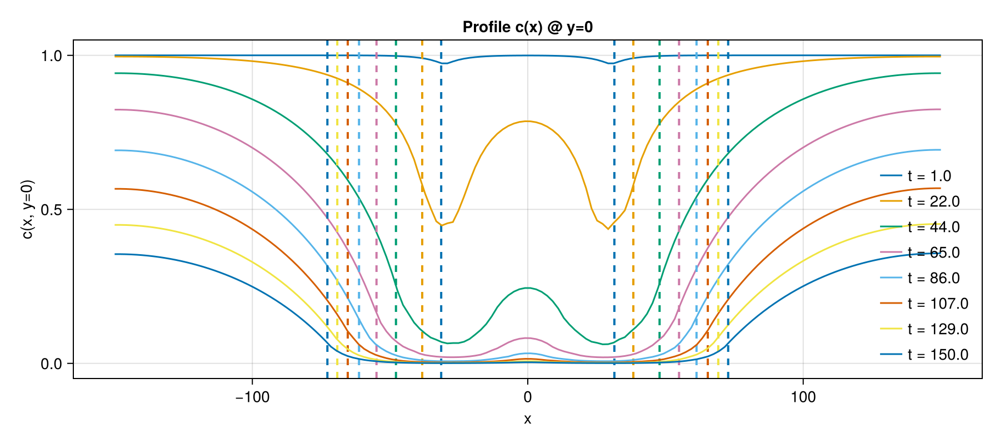

CairoMakie.Screen{IMAGE}


In [245]:
fig_line = Figure(size=(900, 400))
axl = Axis(fig_line[1,1], xlabel="x", ylabel="c(x, y=0)", title="Profile c(x) @ y=0")

xgrid = collect(range(simBox_cpu[1,1], simBox_cpu[1,2], length=size(com.c)[1]))

for (i,j) in enumerate(js)
    # matriz de concentración
    C = com[j].c
    cx = @view C[:, 75]  # perfil en y = 50

    # traza el perfil y guarda el objeto para recuperar su color
    l = lines!(axl, xgrid, cx, label = "t = $(round(j, sigdigits=4))")

    # posición radial máxima
    rmax = sqrt(maximum(com[j].x.^2 .+ com[j].y.^2))

    # dibuja líneas verticales del mismo color
    vlines!(axl, [rmax, -rmax],
            color = l.color[],   # usa el color del perfil
            linestyle = :dash,
            linewidth = 2)
end
# ylims!(axl, 0, 1.05)
axislegend(axl; position=:rb, framevisible=false)
display(fig_line)


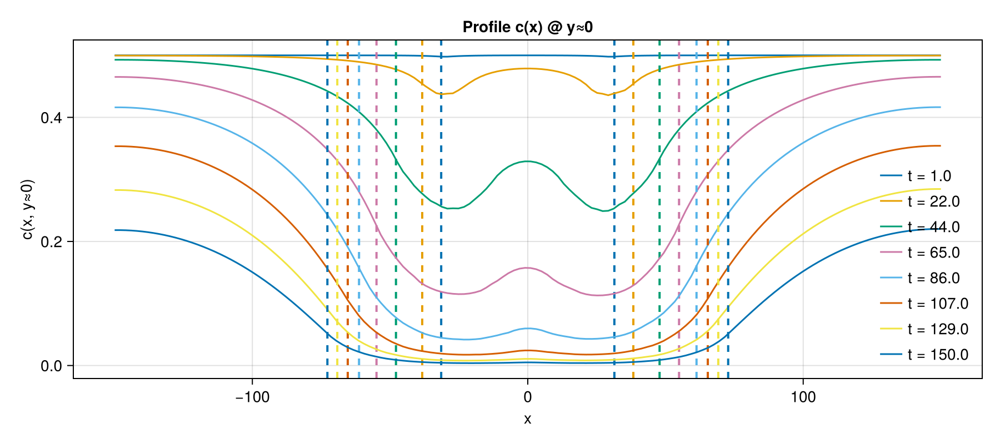

CairoMakie.Screen{IMAGE}


In [248]:
using CairoMakie
# supondremos que tienes: simBox_cpu, com, com, js, times

fig_line = Figure(size=(900, 400))
axl = Axis(fig_line[1,1], xlabel="x", ylabel="c(x, y≈0)",
        title="Profile c(x) @ y≈0")

# Construye malla x directamente del tamaño de Q* (lo haremos dentro del bucle al primer paso)
xgrid = nothing
ygrid = collect(range(simBox_cpu[2,1], simBox_cpu[2,2], length=size(com.c2)[2]))

# índice de y más cercano a 0 (evita asumir 75)
iy0 = argmin(abs.(ygrid .- 0.0))

for (i, j) in enumerate(js)
    # matrices de concentración (x,y)
    Q2 = com[j].c2
    Q1 = com[j].c

    # crea xgrid si aún no existe para que case con el tamaño en x
    if xgrid === nothing
        xgrid = collect(range(simBox_cpu[1,1], simBox_cpu[1,2], length=size(Q1,1)))
    end

    # perfil a y≈0 (no 75 fijo)
    @views c1 = Q1[:, iy0]
    @views c2 = Q2[:, iy0]

    # Hill para activación por PhrF (c) y “desactivación competitiva” por PhrC (c2)
    KF, nF   = com.Kpc[1],  com.npc[1]
    KC, nC   = com.Kpc2[1], com.npc2[1]



    KF, nF   = 1,  10
    KC, nC   = 0.01, 10

    KF, nF   = 0.2,  10
    KC, nC   = 1 ,2
    # definimos explícitamente los arrays Hill
    H1 = (c1 ./ KF) .^ nF          # activación por PhrF (c)
    H2 = (c2 ./ KC) .^ nC          # competencia/desactivación por PhrC

    f = H1 ./ (1 .+ H1 .+ H2)      # fracción de activación neta
    f = H2 ./ (1  .+ H2)      # fracción de activación neta


    # traza el perfil y recupera el color
    l = lines!(axl, xgrid, f, label = "t = $(round(j, sigdigits=4))")

    # radio máximo (si x,y son coordenadas por celda)
    xs = com[j][:x]
    ys = com[j][:y]
    rmax = sqrt(maximum(xs.^2 .+ ys.^2))

    # líneas verticales del mismo color
    vlines!(axl, ([-rmax, rmax]), color = l.color[], linestyle = :dash, linewidth = 2)
end

# ylims!(axl, 0, 1.05) # opcional
axislegend(axl; position=:rb, framevisible=false)
display(fig_line)


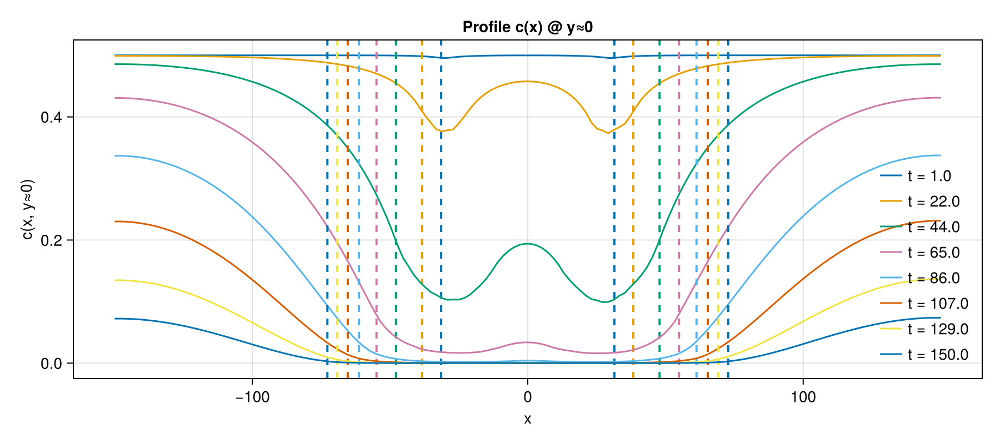

CairoMakie.Screen{IMAGE}


In [247]:
using CairoMakie
# supondremos que tienes: simBox_cpu, com, com, js, times

fig_line = Figure(size=(900, 400))
axl = Axis(fig_line[1,1], xlabel="x", ylabel="c(x, y≈0)",
        title="Profile c(x) @ y≈0")

# Construye malla x directamente del tamaño de Q* (lo haremos dentro del bucle al primer paso)
xgrid = nothing
ygrid = collect(range(simBox_cpu[2,1], simBox_cpu[2,2], length=size(com.c2)[2]))

# índice de y más cercano a 0 (evita asumir 75)
iy0 = argmin(abs.(ygrid .- 0.0))

for (i, j) in enumerate(js)
    # matrices de concentración (x,y)
    Q2 = com[j].c2
    Q1 = com[j].c

    # crea xgrid si aún no existe para que case con el tamaño en x
    if xgrid === nothing
        xgrid = collect(range(simBox_cpu[1,1], simBox_cpu[1,2], length=size(Q1,1)))
    end

    # perfil a y≈0 (no 75 fijo)
    @views c1 = Q1[:, iy0]
    @views c2 = Q2[:, iy0]

    # Hill para activación por PhrF (c) y “desactivación competitiva” por PhrC (c2)
    KF, nF   = com.Kpc[1],  com.npc[1]
    KC, nC   = com.Kpc2[1], com.npc2[1]



    KF, nF   = 1,  10
    KC, nC   = 0.01, 10

    KF, nF   = 0.2,  10
    KC, nC   = 1, 4
    # definimos explícitamente los arrays Hill
    H1 = (c1 ./ KF) .^ nF          # activación por PhrF (c)
    H2 = (c2 ./ KC) .^ nC          # competencia/desactivación por PhrC

    f = H1 ./ (1 .+ H1 .+ H2)      # fracción de activación neta
    f = H2 ./ (1  .+ H2)      # fracción de activación neta


    # traza el perfil y recupera el color
    l = lines!(axl, xgrid, f, label = "t = $(round(j, sigdigits=4))")

    # radio máximo (si x,y son coordenadas por celda)
    xs = com[j][:x]
    ys = com[j][:y]
    rmax = sqrt(maximum(xs.^2 .+ ys.^2))

    # líneas verticales del mismo color
    vlines!(axl, ([-rmax, rmax]), color = l.color[], linestyle = :dash, linewidth = 2)
end

# ylims!(axl, 0, 1.05) # opcional
axislegend(axl; position=:rb, framevisible=false)
display(fig_line)


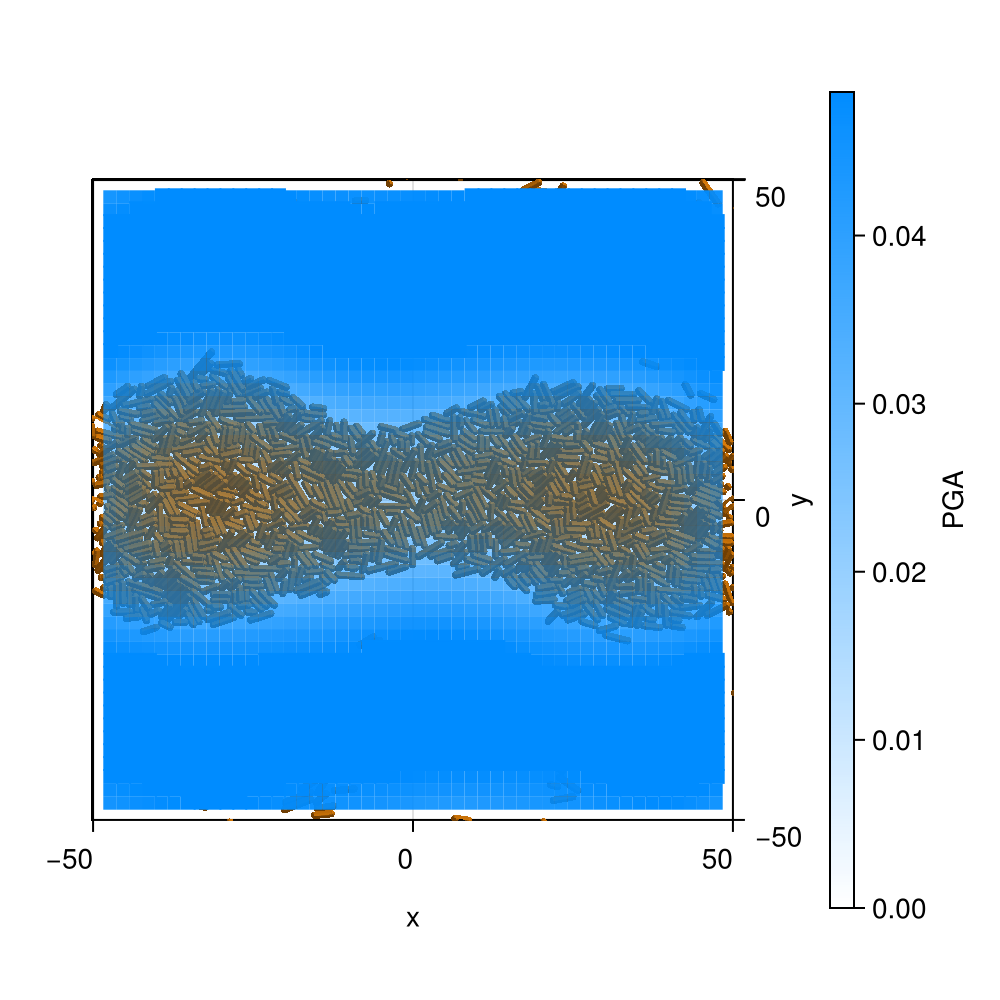

CairoMakie.Screen{IMAGE}


In [ ]:
com,times=load_parameters_log("Tods_c.txt")
simBox_cpu = Array(com.simBox)  # copia a CPU

cmap_transp_orange = cgrad(
    [RGBAf(0.0, 0.55, 1, 0.0),   # verde con alfa 0 (transparente)
     RGBAf(0.0, 0.55, 1, 1.0)],  # verde con alfa 1 (opaco)
    506
)

colormap_c=cmap_transp_orange
# colormap_c=:Oranges
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PGA]), com)))
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PGA]), com)))

fig = Figure(size=(500,500))

js =  length(com)

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    plotAgents2D!(
    ax,
    com[j][:x],
    com[j][:y],
    com[j][:d],
    com[j][:l],
    com[j][:theta],
    com[j][:Vm],
    colormap = Reverse(:inferno),
    colorrange =  (-4, 0),
    )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.PGA)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.PGA)[1]),
            Float64.(hcat(com[j][:PGA]...)),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "PGA"
)
display(fig)

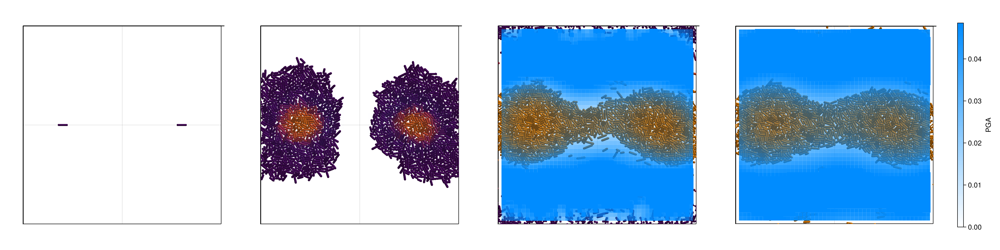

CairoMakie.Screen{IMAGE}


In [ ]:
com,times=load_parameters_log("Tods_c.txt")
fig = Figure(size=(2000,500))

cmap_transp_orange = cgrad(
    [RGBAf(0.0, 0.55, 1, 0.0),   # verde con alfa 0 (transparente)
     RGBAf(0.0, 0.55, 1, 1.0)],  # verde con alfa 1 (opaco)
    506
)

colormap_c=cmap_transp_orange
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PGA]), com)))

# js = [1:round(Int, length(com)/4):length(com); length(com)]
# js =  length(com)
js = round.(Int, range(1, length(com), length=4))
for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false,
                xticksvisible=false,
                yticksvisible=false,
                xticklabelsvisible=false,
                yticklabelsvisible=false,
                xlabelvisible=false,
                ylabelvisible=false

            )

    plotAgents2D!(
    ax,
    com[j][:x],
    com[j][:y],
    com[j][:d],
    com[j][:l],
    com[j][:theta],
    com[j][:Vm],
    colormap = Reverse(:inferno),
    colorrange =  (-4, 0),
    )

    m2 = heatmap!(ax,
        range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.PGA)[1]),
        range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.PGA)[1]),
        Float64.(hcat(com[j][:PGA]...)),
        colormap = colormap_c,
        colorrange = colorrange_c
    )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "PGA"
)

display(fig)

In [ ]:

# Crear figura y ejes
fig = Figure(size = (800, 600))
grid = fig[1, 1] = GridLayout()
ax = Axis(grid[1, 1]; aspect = DataAspect())
hidedecorations!(ax)     # oculta ticks, etiquetas y más
ax.xgridvisible = true
ax.ygridvisible = true

# colorrange = (0.0,  maximum(maximum(p -> maximum(p[:generation]), com)))
colorrange = (0.0,  2.)

Colorbar(fig[1, 2],
    colormap = Reverse(:inferno),
    colorrange =  (-4, 0),
    label = "V"
)


Makie.record(fig, "Colony_zoom.mp4", 1:5:Int(length(com)); framerate = 10) do j
 
    Makie.empty!(ax)
   
    plotAgents2D!(
        ax,
        com[j][:x],
        com[j][:y],
        com[j][:d],
        com[j][:l],
        com[j][:theta],
        # com[j][:type],
        com[j][:Vm],
        colormap = Reverse(:inferno),
        colorrange =  (-4 , 0),
    )


    # xlims!(ax, - (com[j][:rmax][1]+5), com[j][:rmax][1]+5)
    # ylims!(ax, - (com[j][:rmax][1]+5),  com[j][:rmax][1]+5)
    # xlims!(ax, - (com.rmax[1]+5), com.rmax[1]+5)
    # ylims!(ax, - (com.rmax[1]+5),  com.rmax[1]+5)
    xlims!(ax, - (100), 100)
    ylims!(ax, - (100),  100)
end


"Colony_zoom.mp4"

In [210]:

# Crear figura y ejes
fig = Figure(size = (800, 600))
grid = fig[1, 1] = GridLayout()
ax = Axis(grid[1, 1]; aspect = DataAspect())
hidedecorations!(ax)     # oculta ticks, etiquetas y más
ax.xgridvisible = true
ax.ygridvisible = true

# colorrange = (0.0,  maximum(maximum(p -> maximum(p.gneration]), com)))
colorrange = (0.0,  2.)

Colorbar(fig[1, 2],
    colormap = Reverse(:inferno),
    colorrange =  (-4, 0),
    label = "V"
)


Makie.record(fig, "Colony.mp4", 1:5:Int(length(com)); framerate = 10) do j
 
    Makie.empty!(ax)
   
    plotAgents2D!(
        ax,
        com[j].x,
        com[j].y,
        com[j].d,
        com[j].l,
        com[j].theta,
        com[j].Vm,
        colormap = Reverse(:inferno),
        colorrange =  (-4 , 0),
    )

    xlims!(ax, - (50), 50)
    ylims!(ax, - (50),  50)
end


"Colony.mp4"

In [ ]:

# Crear figura y ejes
fig = Figure(size = (800, 600))
grid = fig[1, 1] = GridLayout()
ax = Axis(grid[1, 1]; aspect = DataAspect())
hidedecorations!(ax)     # oculta ticks, etiquetas y más
ax.xgridvisible = true
ax.ygridvisible = true

cmap_transp_orange = cgrad(
    [RGBAf(1.0, 0.55, 0.0, 0.0),   # verde con alfa 0 (transparente)
     RGBAf(1.0, 0.55, 0.0, 1.0)],  # verde con alfa 1 (opaco)
    506
)

colormap_c=cmap_transp_orange
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:QS]), com)))


Colorbar(fig[1, 2],
    colormap = Reverse(:inferno),
    colorrange =  (-4, 0),
    label = "V"
)
Colorbar(fig[1, 3],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "QS"
)

Makie.record(fig, "Colony_QS.mp4", 1:5:Int(length(com)); framerate = 10) do j
 
    Makie.empty!(ax)


   
    plotAgents2D!(
        ax,
        com[j][:x],
        com[j][:y],
        com[j][:d],
        com[j][:l],
        com[j][:theta],
        # com[j][:type],
        com[j][:Vm],
        colormap = Reverse(:inferno),
        colorrange =  (-4 , 0),
    )

    m2 = heatmap!(ax,
        range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.QS)[1]),
        range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.QS)[1]),
        Float64.(hcat(com[j][:QS]...)),
        colormap = colormap_c,
        colorrange = colorrange_c
    )

    # xlims!(ax, - (com[j][:rmax][1]+5), com[j][:rmax][1]+5)
    # ylims!(ax, - (com[j][:rmax][1]+5),  com[j][:rmax][1]+5)
    # xlims!(ax, - (com.rmax[1]+5), com.rmax[1]+5)
    # ylims!(ax, - (com.rmax[1]+5),  com.rmax[1]+5)
    xlims!(ax, - (50), 50)
    ylims!(ax, - (50),  50)
end


"Colony_QS.mp4"

In [ ]:

# Crear figura y ejes
fig = Figure(size = (800, 600))
grid = fig[1, 1] = GridLayout()
ax = Axis(grid[1, 1]; aspect = DataAspect())
hidedecorations!(ax)     # oculta ticks, etiquetas y más
ax.xgridvisible = true
ax.ygridvisible = true

cmap_transp_orange = cgrad(
    [RGBAf(0.0, 0.55, 1, 0.0),   # verde con alfa 0 (transparente)
     RGBAf(0.0, 0.55, 1, 1.0)],  # verde con alfa 1 (opaco)
    706
)

colormap_c=cmap_transp_orange
colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PGA]), com)))


Colorbar(fig[1, 2],
    colormap = Reverse(:inferno),
    colorrange =  (-4, 0),
    label = "V"
)
Colorbar(fig[1, 3],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "PGA"
)

Makie.record(fig, "Colony_PGA.mp4", 1:5:Int(length(com)); framerate = 10) do j
 
    Makie.empty!(ax)

    m2 = heatmap!(ax,
        range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.PGA)[1]),
        range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.PGA)[1]),
        Float64.(hcat(com[j][:PGA]...)),
        colormap = colormap_c,
        colorrange = colorrange_c
    )
   
    plotAgents2D!(
        ax,
        com[j][:x],
        com[j][:y],
        com[j][:d],
        com[j][:l],
        com[j][:theta],
        # com[j][:type],
        com[j][:Vm],
        colormap = Reverse(:inferno),
        colorrange =  (-4 , 0),
    )


    # xlims!(ax, - (com[j][:rmax][1]+5), com[j][:rmax][1]+5)
    # ylims!(ax, - (com[j][:rmax][1]+5),  com[j][:rmax][1]+5)
    # xlims!(ax, - (com.rmax[1]+5), com.rmax[1]+5)
    # ylims!(ax, - (com.rmax[1]+5),  com.rmax[1]+5)
    xlims!(ax, - (70), 70)
    ylims!(ax, - (70),  70)
end


"Colony_PGA.mp4"